In [54]:
#import tensorflow hub and other python libraries for the project
import numpy as np
import time

import PIL.Image as Image
import matplotlib.pylab as plt

import tensorflow as tf
import tensorflow_hub as hub

import datetime

%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [55]:
#download the mobilenet_v2 pretrained model from the tensorflow hub.
mobilenet_v2 ="https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"
classifier_model_mbv = mobilenet_v2 #@param ["mobilenet_v2", "inception_v3"] {type:"raw"}


In [56]:
#Reshape input images to 224 pixel in width and height for mobilenetv2 model
IMAGE_SHAPE_MBV = (224, 224)

classifier = tf.keras.Sequential([
    hub.KerasLayer(classifier_model_mbv, input_shape=IMAGE_SHAPE_MBV+(3,))
])

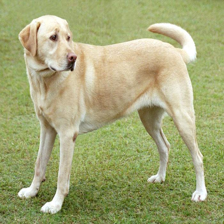

In [57]:
#download a single image from Google cloud storage to test the model on
YellowLabradorLooking = tf.keras.utils.get_file('image.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg')
YellowLabradorLooking = Image.open(YellowLabradorLooking).resize(IMAGE_SHAPE_MBV)
YellowLabradorLooking

In [58]:
YellowLabradorLooking = np.array(YellowLabradorLooking)/255.0
YellowLabradorLooking.shape

(224, 224, 3)

In [59]:
#Add a batch dimension (with np.newaxis) and pass the image to the model:
result = classifier.predict(YellowLabradorLooking[np.newaxis, ...])
result.shape

1/1 [==============================] - 0s 438ms/step


(1, 1001)

In [60]:
predicted_class = tf.math.argmax(result[0], axis=-1)
predicted_class

<tf.Tensor: shape=(), dtype=int64, numpy=209>

In [61]:
#Take the predicted_class ID and fetch the ImageNet dataset labels to decode the predictions
labels_path = tf.keras.utils.get_file('ImageNetLabels.txt','https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt')
imagenet_labels = np.array(open(labels_path).read().splitlines())

In [62]:
#Plot the result against the predicted class using ImageNet Labels
# plt.imshow(YellowLabradorLooking)
# plt.axis('off')
# predicted_class_name = imagenet_labels[predicted_class]
# _ = plt.title("Prediction: " + predicted_class_name.title())


In [63]:
#upload my custom dataset from a private cloud storage and mount the drive.
from google.colab import drive
drive.mount('/content/drive')
import pathlib
mydata_dir = "/content/drive/MyDrive/DPlearning/dataset/"
mydata_dir = pathlib.Path(mydata_dir)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [64]:

#load the data into the model using the image data off disk
BATCH_SIZE = 32
IMG_SIZE_MBV = (224, 224)
SEED = 123
VALIDATION_SPLIT= 0.4

In [65]:
# Split training dataset for MobileNetV2 model
train_dataset_mbv = tf.keras.utils.image_dataset_from_directory(
  mydata_dir,
  validation_split=VALIDATION_SPLIT,
  subset="training",
  seed=SEED,
  image_size=IMG_SIZE_MBV,
  batch_size=BATCH_SIZE)

Found 589 files belonging to 5 classes.
Using 354 files for training.


In [66]:
#use the below code to check the classes of the dataset
class_names_1 = train_dataset_mbv.class_names

print(class_names_1)

['Fruits', 'Grains', 'Meat', 'Pastries', 'Vegetables']


In [67]:
validation_dataset_mbv = tf.keras.utils.image_dataset_from_directory(
  mydata_dir,
  validation_split=VALIDATION_SPLIT,
  subset="validation",
  seed=SEED,
  image_size=IMG_SIZE_MBV,
  batch_size=BATCH_SIZE)

Found 589 files belonging to 5 classes.
Using 235 files for validation.


In [68]:
val_batches_mbv = tf.data.experimental.cardinality(validation_dataset_mbv)
test_dataset_mbv = validation_dataset_mbv.take(val_batches_mbv // 5)
validation_dataset_mbv = validation_dataset_mbv.skip(val_batches_mbv // 5)

print('Number of validation batches: %d' % tf.data.experimental.cardinality(validation_dataset_mbv))
print('Number of test batches: %d' % tf.data.experimental.cardinality(test_dataset_mbv))

Number of validation batches: 7
Number of test batches: 1


In [69]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset_mbv = train_dataset_mbv.prefetch(buffer_size=AUTOTUNE)
validation_dataset_mbv = validation_dataset_mbv.prefetch(buffer_size=AUTOTUNE)
test_dataset_mbv = test_dataset_mbv.prefetch(buffer_size=AUTOTUNE)

In [70]:
train_ds_1 = train_dataset_mbv
val_ds_1 = validation_dataset_mbv
test_ds_1 = test_dataset_mbv

In [71]:
#Normalize the data to meet TensorFlow Hub's image convention for models which is inputs in the range of [0, 1]
normalization_layer_1 = tf.keras.layers.Rescaling(1./255)
train_ds_1 = train_ds_1.map(lambda x, y: (normalization_layer_1(x), y)) # Where x—images, y—labels.
val_ds_1 = val_ds_1.map(lambda x, y: (normalization_layer_1(x), y)) # Where x—images, y—labels.
test_ds_1 = test_ds_1.map(lambda x, y: (normalization_layer_1(x), y)) # Where x—images, y—labels.

In [72]:
# Iterate through the dataset to access image and label batches
for image_batch_1, labels_batch_1 in train_ds_1:
    # Print the shape of the image batch and label batch
    print("Image batch shape:", image_batch_1.shape)
    print("Label batch shape:", labels_batch_1.shape)
    break


Image batch shape: (32, 224, 224, 3)
Label batch shape: (32,)


In [73]:
#run the classifier on the image batch and see how it performs with prediction
result_batch_1 = classifier.predict(train_ds_1)
predicted_class_names_1 = imagenet_labels[tf.math.argmax(result_batch_1, axis=-1)]
predicted_class_names_1

12/12 [==============================] - 30s 412ms/step


array(['crayfish', 'coho', 'grocery store', 'orange', 'acorn',
       'jackfruit', 'grocery store', 'butcher shop', 'frying pan', 'pot',
       'wok', 'butcher shop', 'pot', 'plastic bag', 'pretzel', 'pretzel',
       'butcher shop', 'head cabbage', 'hot pot', 'head cabbage',
       'grocery store', 'pot', 'butcher shop', 'lumbermill',
       'butcher shop', 'pomegranate', 'bell pepper', 'sea urchin',
       'head cabbage', 'bakery', 'cucumber', 'butcher shop', 'ear',
       'head cabbage', 'butcher shop', 'maraca', 'ping-pong ball',
       'cucumber', 'orange', 'cucumber', 'crate', 'mortar', 'pineapple',
       'bakery', 'cucumber', 'grocery store', 'cucumber', 'garbage truck',
       'head cabbage', 'honeycomb', 'prayer rug', 'buckeye',
       'grocery store', 'butcher shop', 'wool', 'butcher shop',
       'head cabbage', 'pomegranate', 'maze', 'bakery', 'pinwheel',
       'buckeye', 'zucchini', 'bakery', 'bath towel', 'ear',
       'butcher shop', 'lemon', 'French loaf', 'head cabba

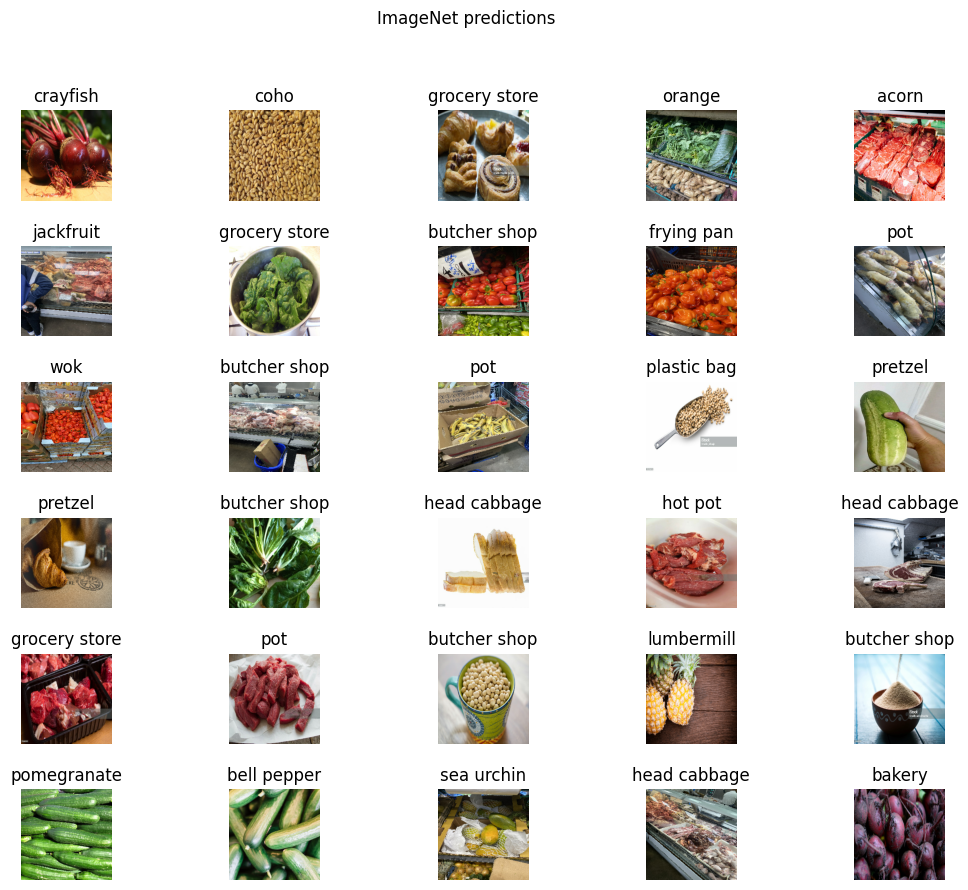

In [74]:
#check how these line up with the images using ImageNet predictions
plt.figure(figsize=(13,10))
plt.subplots_adjust(hspace=0.5)
for n in range(30):
  plt.subplot(6,5,n+1)
  plt.imshow(image_batch_1[n])
  plt.title(predicted_class_names_1[n])
  plt.axis('off')
_ = plt.suptitle("ImageNet predictions")

In [75]:
#download the headless model from TensorFlow Hub for feature extraction
mobilenet_v2 = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"


feature_extractor_model_mbv = mobilenet_v2

In [76]:
#create the feature extractor.freeze for mobilevnet and inception the variables, so that the training only adjusts the new top classifier layer
feature_extractor_layer_1 = hub.KerasLayer(
    feature_extractor_model_mbv,
    input_shape=(224, 224, 3),
    trainable=False)

In [77]:
feature_batch_1 = feature_extractor_layer_1(image_batch_1)
print("Feature batch shape for MobileNetV2:", feature_batch_1.shape)

Feature batch shape for MobileNetV2: (32, 1280)


In [78]:
#attach a classification head for MobileNetV2 and add dense layers
num_classes_1 = len(class_names_1)

model = tf.keras.Sequential([
  feature_extractor_layer_1,
  tf.keras.layers.Dense(num_classes_1)
])

model.summary()


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_4 (KerasLayer)  (None, 1280)              2257984   
                                                                 
 dense_1 (Dense)             (None, 5)                 6405      
                                                                 
Total params: 2264389 (8.64 MB)
Trainable params: 6405 (25.02 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [79]:
predictions = model(image_batch_1)
predictions.shape

TensorShape([32, 5])

In [80]:
#use Model.compile to configure the training process and add a tf.keras.callbacks.TensorBoard to create and store logs
model.compile(
  optimizer=tf.keras.optimizers.Adam(),
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['acc'])

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=1) #enables histogram computation for every epoch


In [81]:
#use the Model.fit method to train the model
NUM_EPOCHS_1 = 10

history = model.fit(train_ds_1,
                    validation_data=val_ds_1,
                    epochs=NUM_EPOCHS_1,
                    callbacks=tensorboard_callback)

Epoch 1/10
12/12 [==============================] - 76s 4s/step - loss: 1.3662 - acc: 0.4181 - val_loss: 0.8295 - val_acc: 0.7635
Epoch 2/10
12/12 [==============================] - 71s 4s/step - loss: 0.6589 - acc: 0.8107 - val_loss: 0.4905 - val_acc: 0.8867
Epoch 3/10
12/12 [==============================] - 71s 4s/step - loss: 0.4197 - acc: 0.9068 - val_loss: 0.3849 - val_acc: 0.8966
Epoch 4/10
12/12 [==============================] - 72s 4s/step - loss: 0.3110 - acc: 0.9237 - val_loss: 0.3415 - val_acc: 0.9015
Epoch 5/10
12/12 [==============================] - 71s 4s/step - loss: 0.2483 - acc: 0.9322 - val_loss: 0.3007 - val_acc: 0.9113
Epoch 6/10
12/12 [==============================] - 69s 4s/step - loss: 0.2009 - acc: 0.9576 - val_loss: 0.2866 - val_acc: 0.9064
Epoch 7/10
12/12 [==============================] - 70s 4s/step - loss: 0.1707 - acc: 0.9605 - val_loss: 0.2581 - val_acc: 0.9212
Epoch 8/10
12/12 [==============================] - 72s 4s/step - loss: 0.1525 - acc: 0.97

In [82]:

%tensorboard --logdir logs/fit

Output hidden; open in https://colab.research.google.com to view.

In [83]:
#obtain the ordered list of class names from the model predictions

predicted_batch = model.predict(image_batch_1)
predicted_id = tf.math.argmax(predicted_batch, axis=-1)
predicted_id_numpy = predicted_id.numpy()
predicted_label_batch = np.array(class_names_1)[predicted_id_numpy]
print(predicted_label_batch)

1/1 [==============================] - 0s 435ms/step
['Fruits' 'Grains' 'Pastries' 'Vegetables' 'Meat' 'Meat' 'Vegetables'
 'Vegetables' 'Vegetables' 'Meat' 'Vegetables' 'Meat' 'Fruits' 'Grains'
 'Fruits' 'Pastries' 'Vegetables' 'Pastries' 'Meat' 'Meat' 'Meat' 'Meat'
 'Grains' 'Fruits' 'Grains' 'Fruits' 'Fruits' 'Fruits' 'Meat' 'Vegetables'
 'Vegetables' 'Grains']


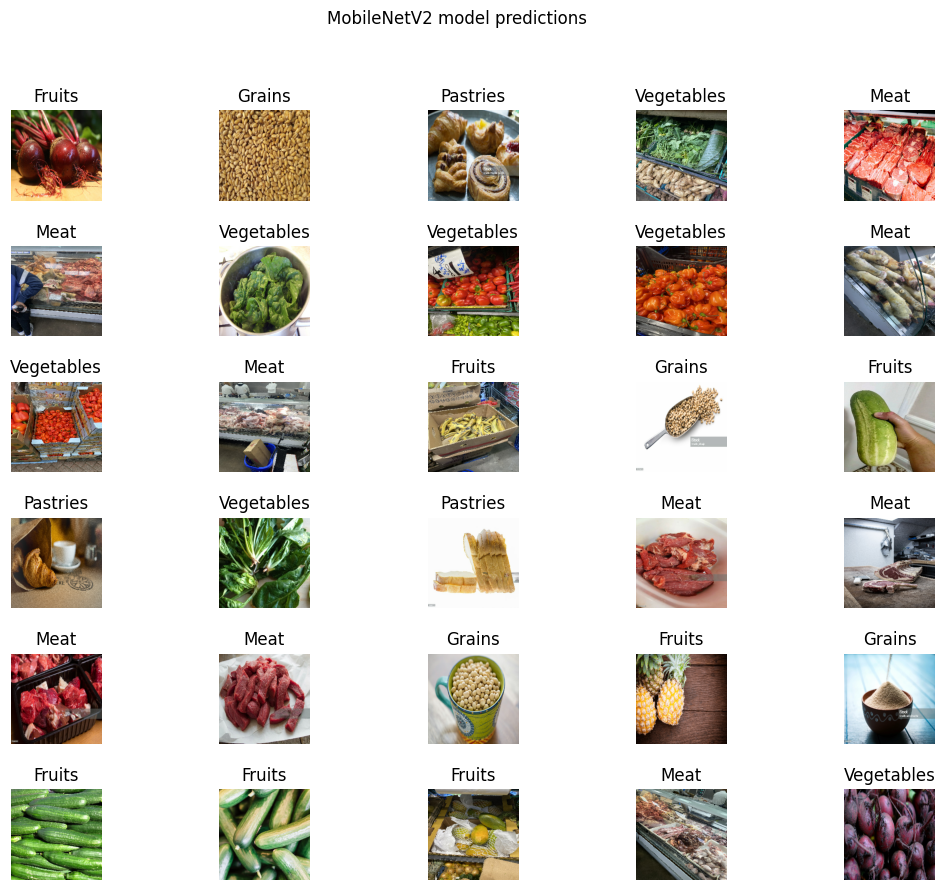

In [84]:
#plot and visualize the model predictions
plt.figure(figsize=(13,10))
plt.subplots_adjust(hspace=0.5)

for n in range(30):
  plt.subplot(6,5,n+1)
  plt.imshow(image_batch_1[n])
  plt.title(predicted_label_batch[n].title())
  plt.axis('off')
_ = plt.suptitle("MobileNetV2 model predictions")

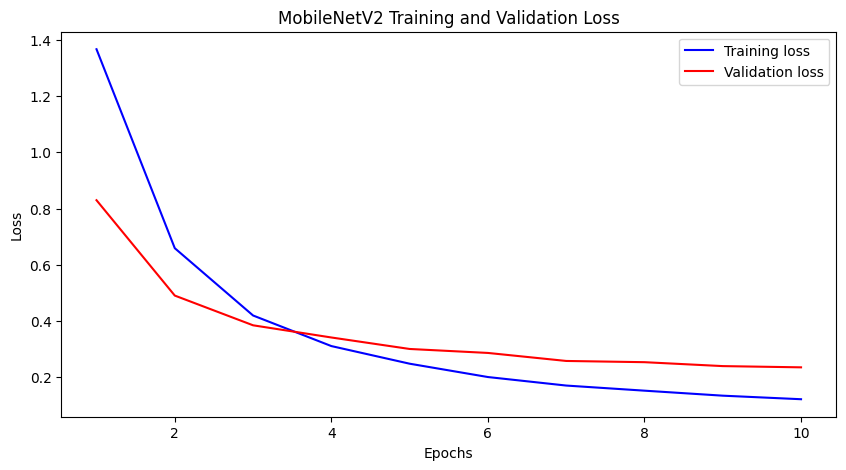

In [85]:
#plot the loss, accurary and validation accuracy
def plot_loss_accuracy(history):

 # Access the loss and accuracy data from the history object
    loss = history.history['loss']
    val_loss = history.history['val_loss']


    # Get the number of epochs
    epochs = range(1, len(loss) + 1)

    # Plotting the loss
    plt.figure(figsize=(10, 5))
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.title('MobileNetV2 Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Show the plot
    plt.show()

    # 'History' is the variable that contains the training history after model fitting
plot_loss_accuracy(history)




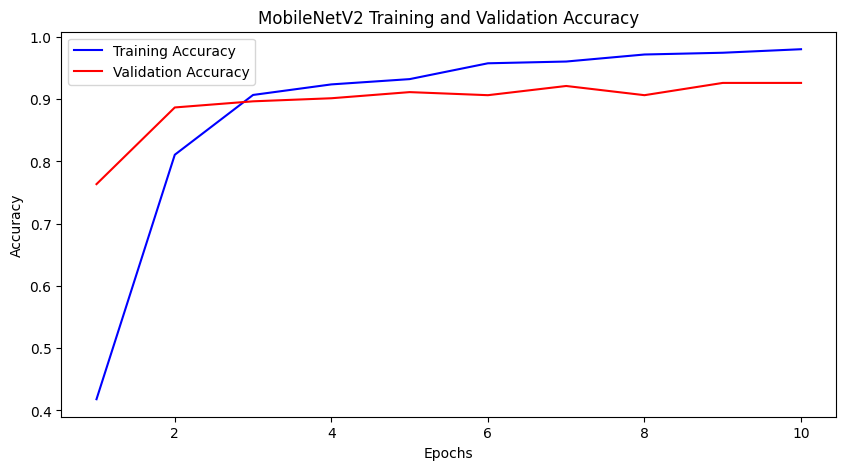

In [86]:
#plot the loss, accurary and validation accuracy
def plot_accuracy(history):

 # Access the loss and accuracy data from the history object
    acc = history.history['acc']
    val_accuracy = history.history['val_acc']


    # Get the number of epochs
    epochs = range(1, len(acc) + 1)

    # Plotting the loss
    plt.figure(figsize=(10, 5))
    plt.plot(epochs, acc, 'b', label='Training Accuracy')
    plt.plot(epochs, val_accuracy, 'r', label='Validation Accuracy')
    plt.title('MobileNetV2 Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Show the plot
    plt.show()

    # 'History' is the variable that contains the training history after model fitting
plot_accuracy(history)




In [87]:
#Initialize numpy arrays to hold values of the true and predicted labels
y_test_labels_mbv = []
y_pred_1 = []

#Iterate over the dataset
for images, labels in test_ds_1:
    preds = model.predict(images)
    pred_classes = np.argmax(preds, axis=1)
    y_test_labels_mbv.extend(labels.numpy())
    y_pred_1.extend(pred_classes)

#converting list to arrays for the function
y_test_labels_mbv = np.array(y_test_labels_mbv)
y_pred_1 = np.array(y_pred_1)

print("Shape of y_test_labels for mobilnetV2:", y_test_labels_mbv.shape)
print("Shape of y_pred for mobilnetV2:", y_pred_1.shape)


1/1 [==============================] - 0s 30ms/step
Shape of y_test_labels for mobilnetV2: (32,)
Shape of y_pred for mobilnetV2: (32,)


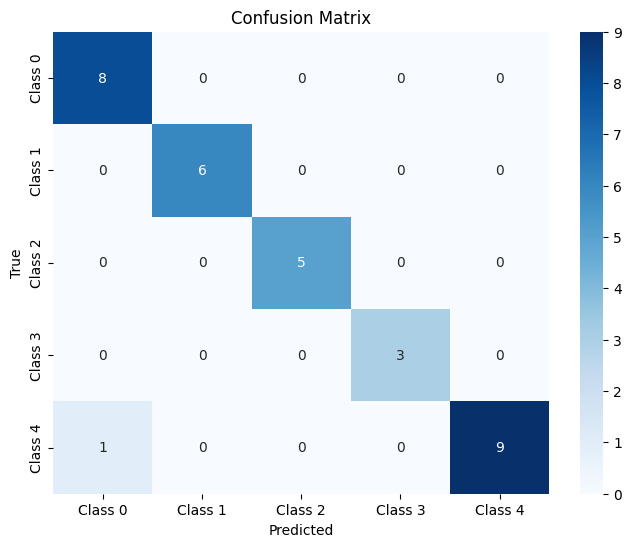

Accuracy: 0.96875
F1 Score: 0.9688467492260062
Recall: 0.96875
Precision: 0.9722222222222222


In [88]:

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns

# Calculate the confusion matrix for mobilenetV2
cm = confusion_matrix(y_test_labels_mbv, y_pred_1)
class_names_1 = [f'Class {i}' for i in range(5)]


plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=class_names_1, yticklabels=class_names_1)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Calculate Accuracy for MobileNetV2
accuracy = accuracy_score(y_test_labels_mbv, y_pred_1)
print("Accuracy:", accuracy)

# Calculate F1 score for MobileNetV2
f1 = f1_score(y_test_labels_mbv, y_pred_1, average='weighted')
print("F1 Score:", f1)


# Calculate recall for MobileNetV2
recall = recall_score(y_test_labels_mbv, y_pred_1, average='weighted')
print("Recall:", recall)


# Calculate precision for MobileNetV2
precision = precision_score(y_test_labels_mbv, y_pred_1, average='weighted')
print("Precision:", precision)


In [89]:
# Print the classification report for MobileNetV2
print('Classification Report:')
print(classification_report(y_test_labels_mbv, y_pred_1, target_names=class_names_1))

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.89      1.00      0.94         8
     Class 1       1.00      1.00      1.00         6
     Class 2       1.00      1.00      1.00         5
     Class 3       1.00      1.00      1.00         3
     Class 4       1.00      0.90      0.95        10

    accuracy                           0.97        32
   macro avg       0.98      0.98      0.98        32
weighted avg       0.97      0.97      0.97        32



In [98]:
#downlaid the inception_v3 pretrained models from the tensorflow hub.
inception_v3 = "https://tfhub.dev/google/imagenet/inception_v3/classification/5"


classifier_model_inc = inception_v3 #@param ["inception_v3", "inception_v3"] {type:"raw"}


In [91]:
#Reshape input images to 299 pixels in width and height for inceptionv3 model
IMAGE_SHAPE_INC = (299, 299)

classifier = tf.keras.Sequential([
    hub.KerasLayer(classifier_model_inc, input_shape=IMAGE_SHAPE_INC+(3,))
])

In [92]:
#load the data into the model using the image data off disk
BATCH_SIZE = 32
IMG_SIZE_INC = (299, 299)
SEED = 123
VALIDATION_SPLIT= 0.3

In [93]:
 #Split training dataset for InceptionV3 model
 train_dataset_inc = tf.keras.utils.image_dataset_from_directory(
  mydata_dir,
  validation_split=VALIDATION_SPLIT,
  subset="training",
  seed=SEED,
  image_size=IMG_SIZE_INC,
  batch_size=BATCH_SIZE)

Found 589 files belonging to 5 classes.
Using 413 files for training.


In [96]:
#check the classes of the dataset
class_names_2 = train_dataset_inc.class_names

print(class_names_2)

['Fruits', 'Grains', 'Meat', 'Pastries', 'Vegetables']


In [99]:
validation_dataset_inc = tf.keras.utils.image_dataset_from_directory(
  mydata_dir,
  validation_split=VALIDATION_SPLIT,
  subset="validation",
  seed=SEED,
  image_size=IMG_SIZE_INC,
  batch_size=BATCH_SIZE)

Found 589 files belonging to 5 classes.
Using 176 files for validation.


In [101]:
val_batches_inc = tf.data.experimental.cardinality(validation_dataset_inc)
test_dataset_inc = validation_dataset_inc.take(val_batches_inc // 5)
validation_dataset_inc = validation_dataset_inc.skip(val_batches_inc // 5)

print('Number of validation batches: %d' % tf.data.experimental.cardinality(validation_dataset_inc))
print('Number of test batches: %d' % tf.data.experimental.cardinality(test_dataset_inc))

Number of validation batches: 5
Number of test batches: 1


In [102]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset_inc = train_dataset_inc.prefetch(buffer_size=AUTOTUNE)
validation_dataset_inc = validation_dataset_inc.prefetch(buffer_size=AUTOTUNE)
test_dataset_inc = test_dataset_inc.prefetch(buffer_size=AUTOTUNE)

In [103]:
train_ds_2 = train_dataset_inc
val_ds_2 = validation_dataset_inc
test_ds_2 = test_dataset_inc

In [104]:
#Normalize the data to meet TensorFlow Hub's image convention for models which is inputs in the range of [0, 1]
normalization_layer_2 = tf.keras.layers.Rescaling(1./255)
train_ds_2 = train_ds_2.map(lambda x, y: (normalization_layer_2(x), y)) # Where x—images, y—labels.
val_ds_2 = val_ds_2.map(lambda x, y: (normalization_layer_2(x), y)) # Where x—images, y—labels.
test_ds_2 = test_ds_2.map(lambda x, y: (normalization_layer_2(x), y)) # Where x—images, y—labels.

In [105]:
# Iterate through the dataset to access image and label batches
for image_batch_2, labels_batch_2 in train_ds_2:
    # Print the shape of the image batch and label batch
    print("Image batch shape:", image_batch_2.shape)
    print("Label batch shape:", labels_batch_2.shape)
    break

Image batch shape: (32, 299, 299, 3)
Label batch shape: (32,)


In [107]:
#run the classifier on the image batch and see how it performs with prediction
result_batch_2 = classifier.predict(train_ds_2)
predicted_class_names_2 = imagenet_labels[tf.math.argmax(result_batch_2, axis=-1)]
predicted_class_names_2

13/13 [==============================] - 33s 807ms/step


array(['grocery store', 'cucumber', 'pomegranate', 'butcher shop',
       'zucchini', 'cucumber', 'grocery store', 'lemon', 'cucumber',
       'bell pepper', 'butcher shop', 'butcher shop', 'cucumber',
       'bell pepper', 'ping-pong ball', 'conch', 'bakery', 'butcher shop',
       'pretzel', 'French loaf', 'packet', 'head cabbage',
       'grocery store', 'butcher shop', 'bakery', 'head cabbage',
       'butcher shop', 'cucumber', 'zucchini', 'butcher shop',
       'butcher shop', 'grocery store', 'pretzel', 'bakery',
       'butcher shop', 'French loaf', 'wooden spoon', 'grocery store',
       'bakery', 'acorn squash', 'French loaf', 'French loaf',
       'soup bowl', 'acorn', 'cucumber', 'hourglass', 'pineapple',
       'bagel', 'ladle', 'cucumber', 'bakery', 'French loaf',
       'pomegranate', 'chiton', 'plate', 'Band Aid', 'French loaf', 'hip',
       'butcher shop', 'cucumber', 'head cabbage', 'pretzel',
       'acorn squash', 'paintbrush', 'butcher shop', 'banana',
       'hea

In [108]:
#download the headless model from TensorFlow Hub for feature extraction
inception_v3 = "https://tfhub.dev/google/tf2-preview/inception_v3/feature_vector/4"


feature_extractor_model_inc = inception_v3

In [110]:
 #create the feature extractor.freeze for mobilevnet and inception the variables, so that the training only adjusts the new top classifier layer
 feature_extractor_layer_2 = hub.KerasLayer(
    feature_extractor_model_inc,
    input_shape=(299, 299, 3),
    trainable=False)

In [111]:
feature_batch_2 = feature_extractor_layer_2(image_batch_2)
print("Feature batch shape for InceptionV3:", feature_batch_2.shape)

Feature batch shape for InceptionV3: (32, 2048)


In [112]:
#attach a classification head for InceptiobV3 and add dense layers
num_classes_2 = len(class_names_2)

model = tf.keras.Sequential([
  feature_extractor_layer_2,
  tf.keras.layers.Dense(num_classes_2)
])

model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_7 (KerasLayer)  (None, 2048)              21802784  
                                                                 
 dense_2 (Dense)             (None, 5)                 10245     
                                                                 
Total params: 21813029 (83.21 MB)
Trainable params: 10245 (40.02 KB)
Non-trainable params: 21802784 (83.17 MB)
_________________________________________________________________


In [113]:
#use Model.compile to configure the training process and add a tf.keras.callbacks.TensorBoard to create and store logs
model.compile(
  optimizer=tf.keras.optimizers.Adam(),
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['acc'])

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=1) #enables histogram computation for every epoch

In [115]:
#use the Model.fit method to train the model
NUM_EPOCHS_2 = 10

history = model.fit(train_ds_2,
                    validation_data=val_ds_2,
                    epochs=NUM_EPOCHS_2,
                    callbacks=tensorboard_callback)

Epoch 1/10
13/13 [==============================] - 87s 5s/step - loss: 1.2721 - acc: 0.5254 - val_loss: 0.7781 - val_acc: 0.8125
Epoch 2/10
13/13 [==============================] - 60s 3s/step - loss: 0.6496 - acc: 0.8475 - val_loss: 0.5527 - val_acc: 0.8472
Epoch 3/10
13/13 [==============================] - 61s 3s/step - loss: 0.4168 - acc: 0.9056 - val_loss: 0.3994 - val_acc: 0.9097
Epoch 4/10
13/13 [==============================] - 58s 3s/step - loss: 0.3057 - acc: 0.9298 - val_loss: 0.3576 - val_acc: 0.8889
Epoch 5/10
13/13 [==============================] - 59s 3s/step - loss: 0.2581 - acc: 0.9370 - val_loss: 0.3202 - val_acc: 0.8958
Epoch 6/10
13/13 [==============================] - 59s 3s/step - loss: 0.2167 - acc: 0.9492 - val_loss: 0.2764 - val_acc: 0.9097
Epoch 7/10
13/13 [==============================] - 58s 3s/step - loss: 0.1899 - acc: 0.9564 - val_loss: 0.2650 - val_acc: 0.9236
Epoch 8/10
13/13 [==============================] - 55s 3s/step - loss: 0.1670 - acc: 0.96

In [116]:
%tensorboard --logdir logs/fit

Output hidden; open in https://colab.research.google.com to view.

In [117]:
#obtain the ordered list of class names from the model predictions

predicted_batch = model.predict(image_batch_2)
predicted_id = tf.math.argmax(predicted_batch, axis=-1)
predicted_id_numpy = predicted_id.numpy()
predicted_label_batch = np.array(class_names_2)[predicted_id_numpy]
print(predicted_label_batch)

1/1 [==============================] - 1s 774ms/step
['Vegetables' 'Grains' 'Pastries' 'Vegetables' 'Meat' 'Meat' 'Vegetables'
 'Vegetables' 'Vegetables' 'Meat' 'Fruits' 'Meat' 'Fruits' 'Grains'
 'Fruits' 'Pastries' 'Vegetables' 'Pastries' 'Meat' 'Meat' 'Meat' 'Meat'
 'Grains' 'Fruits' 'Grains' 'Fruits' 'Fruits' 'Fruits' 'Meat' 'Vegetables'
 'Vegetables' 'Grains']


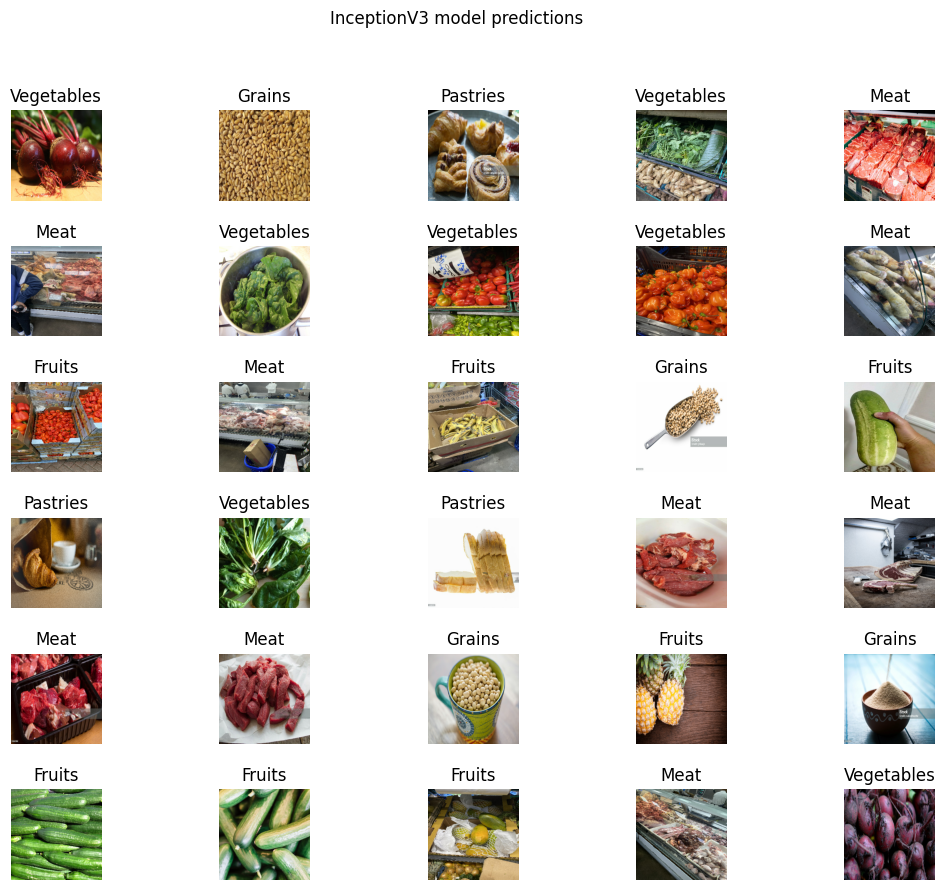

In [118]:
#plot and visualize the model predictions
plt.figure(figsize=(13,10))
plt.subplots_adjust(hspace=0.5)

for n in range(30):
  plt.subplot(6,5,n+1)
  plt.imshow(image_batch_2[n])
  plt.title(predicted_label_batch[n].title())
  plt.axis('off')
_ = plt.suptitle("InceptionV3 model predictions")

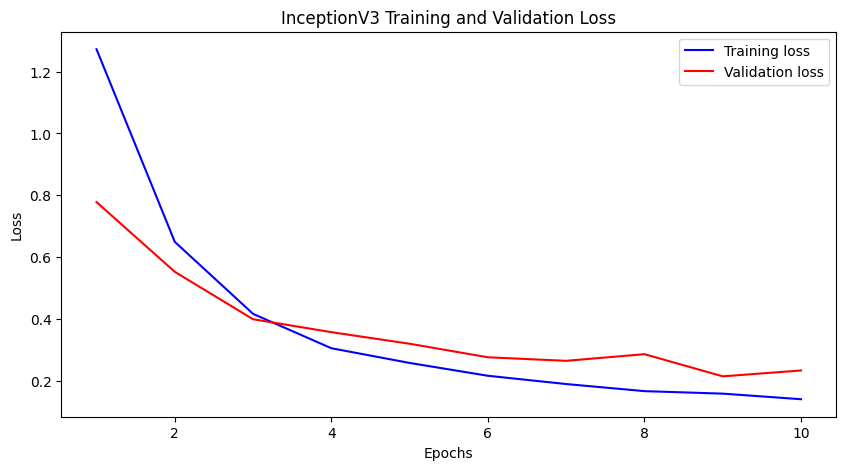

In [119]:
#plot the loss, accurary and validation accuracy
def plot_loss_accuracy(history):

 # Access the loss and accuracy data from the history object
    loss = history.history['loss']
    val_loss = history.history['val_loss']


    # Get the number of epochs
    epochs = range(1, len(loss) + 1)

    # Plotting the loss
    plt.figure(figsize=(10, 5))
    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.title('InceptionV3 Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Show the plot
    plt.show()

    # 'History' is the variable that contains the training history after model fitting
plot_loss_accuracy(history)

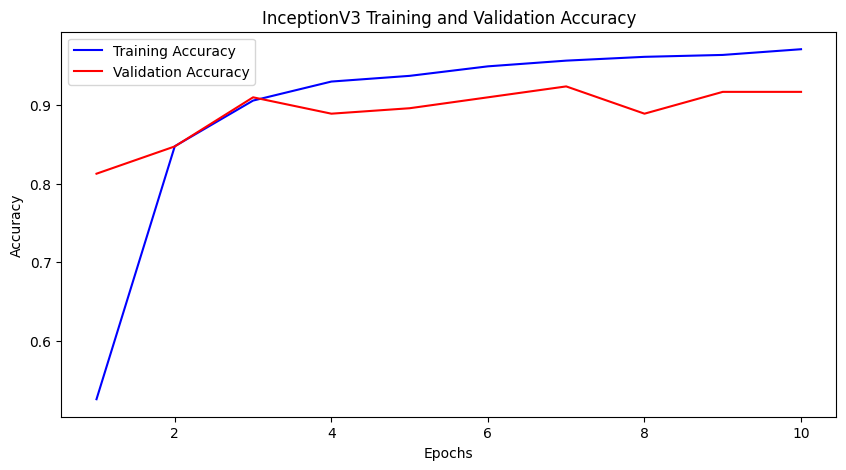

In [120]:
#plot the loss, accurary and validation accuracy
def plot_accuracy(history):

 # Access the loss and accuracy data from the history object
    acc = history.history['acc']
    val_accuracy = history.history['val_acc']


    # Get the number of epochs
    epochs = range(1, len(acc) + 1)

    # Plotting the loss
    plt.figure(figsize=(10, 5))
    plt.plot(epochs, acc, 'b', label='Training Accuracy')
    plt.plot(epochs, val_accuracy, 'r', label='Validation Accuracy')
    plt.title('InceptionV3 Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Show the plot
    plt.show()

    # 'History' is the variable that contains the training history after model fitting
plot_accuracy(history)


In [121]:
#Initialize numpy arrays to hold values of the true and predicted labels
y_test_labels_inc = []
y_pred_2 = []

# Iterate over the test dataset
for images, labels in test_ds_2:
    preds = model.predict(images)
    pred_classes = np.argmax(preds, axis=1)
    y_test_labels_inc.extend(labels.numpy())
    y_pred_2.extend(labels.numpy())

#converting list to arrays for the function
y_test_labels_inc = np.array(y_test_labels_inc)
y_pred_2 = np.array(y_pred_2)

print("Shape of y_test_labels inceptionV3:", y_test_labels_inc.shape)
print("Shape of y_pred inceptionV3:", y_pred_2.shape)

1/1 [==============================] - 0s 46ms/step
Shape of y_test_labels inceptionV3: (32,)
Shape of y_pred inceptionV3: (32,)


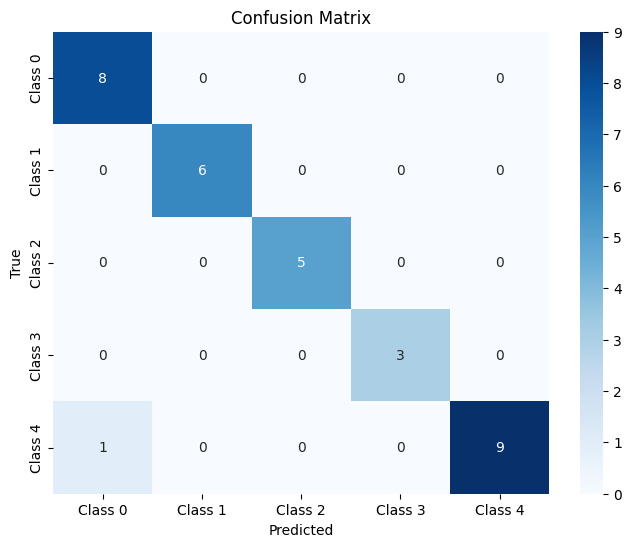

Accuracy: 1.0
F1 Score: 1.0
Recall: 1.0
Precision: 1.0


In [123]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns

# Calculate the confusion matrix for inceptionV3
cm = confusion_matrix(y_test_labels_mbv, y_pred_1)
class_names_2 = [f'Class {i}' for i in range(5)]

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=class_names_2, yticklabels=class_names_2)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Calculate Accuracy for InceptionV3
accuracy = accuracy_score(y_test_labels_inc, y_pred_2)
print("Accuracy:", accuracy)

# Calculate F1 score for InceptionV3
f1 = f1_score(y_test_labels_inc, y_pred_2, average='weighted')
print("F1 Score:", f1)

# Calculate recall for InceptionV3
recall = recall_score(y_test_labels_inc, y_pred_2, average='weighted')
print("Recall:", recall)

# Calculate precision for InceptionV3
precision = precision_score(y_test_labels_inc, y_pred_2, average='weighted')
print("Precision:", precision)

In [125]:
# Print the classification report for InceptionV3
print('Classification Report:')
print(classification_report(y_test_labels_inc, y_pred_2, target_names=class_names_2))

Classification Report:
              precision    recall  f1-score   support

     Class 0       1.00      1.00      1.00         6
     Class 1       1.00      1.00      1.00         5
     Class 2       1.00      1.00      1.00         7
     Class 3       1.00      1.00      1.00         7
     Class 4       1.00      1.00      1.00         7

    accuracy                           1.00        32
   macro avg       1.00      1.00      1.00        32
weighted avg       1.00      1.00      1.00        32

